# **AP155 Lab Assignment**
## Module 5: Partial Differential Equations

_Instructions_: Answer each problem as completely as you can. Discuss **all** your answers as clearly and concisely as possible.

_Scoring Criteria_: 50% - *correctness of code*; 50% - *discussion of the code and results*. Maximum score is **100 points**.



### Student Information

_Full Name (Last Name, First Name)_: BALEJADO, Venser H.\
_Student No._: 2022-13875\
_Section_: THV-TX-2

### Submission Information

_Date and Time Submitted (most recent upload)_: November 16, 2024 - 09:30 PM 

**HONOR PLEDGE** I affirm that I have upheld the highest principles of honesty and integrity in my academic work and that this lab assignment is my own work.

**Sign here with your full name: VENSER HALILI BALEJADO**

### Grading Information (c/o Lab Instructor)

TOTAL SCORE: **[]**/100

Score breakdown:
* Problem 1 - []/100

_Date and Time Scored (MM/DD/YYYY HH:MM AM/PM):_

### PROBLEM 1
**The Schrodinger equation and the Crank-Nicolson method**

_Refer to Exercise 9.8 in the Newman text._ In this problem, you will use the Crank-Nicolson method to solve the full time-dependent Schrodinger equation and hence develop a picture of how a wavefunction evolves over time.

Consider an electron (mass $M = 9.109 \times 10^{-31}$ kg) in a box of length $L = 10^{-8}$ m. Suppose that at time $t = 0$ the wavefunction of the electron has the form

$$ \psi(x,0) = \exp\left[-\frac{(x-x_0)^2}{2\sigma^2}\right]e^{i\kappa x},$$
where $x_0 = \frac{L}{2}$, $\sigma = 1 \times 10^{-10}$ m, $\kappa = 5 \times 10^{10} {\rm m}^{-1}$,  and $\psi = 0$ on the walls at $x = 0$ and $x = L$.

1. Perform a single step of the Crank-Nicolson method for this electron, calculating the vector $\psi(t)$ of values of the wavefunction, given the initial wavefunction above and using $N = 1000$ spatial slices with $a = L/N$. Your program will have to perform the following steps. First, given the vector $\psi(0)$ at $t = 0$, you will have to multiply by the matrix $\bf{B}$ to get a vector $\bf{v} = \bf{B}\psi$. Because of the tridiagonal form of $\bf{B}$, this is fairly simple. The $i$th component of $\bf{v}$ is given by
$$ v_i = b_1\psi_i + b_2(\psi_{i+1} + \psi_{i-1}).$$

   You will also have to choose a value for the time-step $h$. A reasonable choice is $h = 10^{-18}$ s. *(30 pts.)*

2. Second you will have to solve the linear system ${\bf Ax}= {\bf v}$ for $\bf{x}$, which gives you the new value of $\psi$. You could do this using a standard linear equation solver like the function $\tt solve$ in numpy's $\tt linalg$. *(20 pts.)*

3. Once you have the code in place to perform a single step of the calculation, extend your program to perform repeated steps and hence solve for $\psi$ at a sequence of times a separation $h$ apart. Note that the matrix $\bf A$ is independent of time, so it doesn't change from one step to another. You can set up the matrix just once and then keep on reusing it for every step. *(30 pts.)*

4. Make an animation of the solution by displaying the real part of the wavefunction at each time-step. You can use the function rate from the package visual to ensure a smooth frame-rate for your animation-- see Section 3.5 on page 117 of the Newman text.

   Run your animation for a while and describe what you see. Write a few sentences explaining in physics terms what is going on in the system. *(20 pts.)*

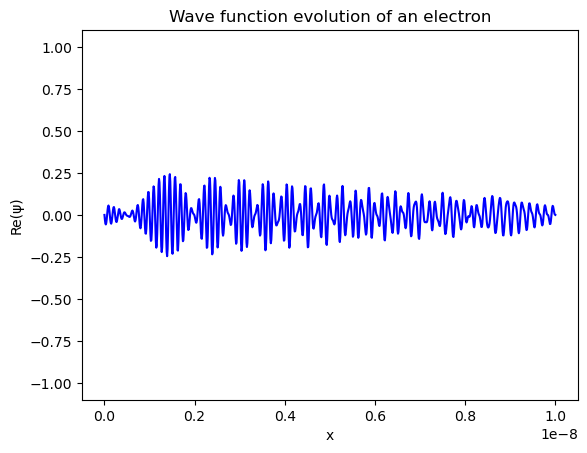

In [4]:
# Imports used in the script
import numpy as np                               # for numerical calculations
import matplotlib.pyplot as plt                  # for plotting
from scipy.linalg import solve                   # for the matrix computation
from matplotlib.animation import FuncAnimation   # for creating animations

# Defining the constants
L = 1e-8                        # Width of the square well [m]
h = 1e-18                       # time step Interval [s]
time_steps = 1000               # Number of time steps
N = 1000                        # number of spatial grid steps
M = 9.109e-31                   # The mass of electron [kg]
hbar = 1.0546e-34               # Reduced Planck's constant [m^2 kg / s]
a = L / N                       # Length of each spatial step [m]

# Initial wavefunction parameters
x_0 = L / 2                     # Center of initial wavefunction [m]
sigma = 1e-10                   # Width parameter of initial wavefunction [m]
k = 5.0e10                      # kappa - wave number of the initial wavepacket
                                # this is used to control the wavepackets momentum

# Setting up the initial condition, we define all the variable in psi(x,0)
def psi_i(x): # initial wavefunction, this have the gaussian envelope that is modulated by a plane wave
  return np.exp(-(x-x_0)**2/(2*sigma**2))*np.exp(1j*k*x)

#extracting value for x and psi0 values for different index
x = np.linspace (0, L, N + 1)       # array of evenly spaced points
psi = np.zeros(N + 1, complex)      # for storing the wavefunction values
psi[:] = psi_i(x)                   
psi[[0, N]] = 0                     # this sets the boundary conditions where the wavefunction is zero at the edges

# Defining the Crank-Nicolson Coeffs. to solve the Schrodingers equation. derived from the discretization of Time Indepent SE.
b2 = (h * hbar * 1j) / (4 * M * a**2)
a2 = (-h * hbar * 1j) / (4 * M * a**2)
a1 = 1 + h * (hbar * 1j) / (2 * M * a**2)
b1 = 1 - (h * hbar * 1j) / (2 * M * a**2)

# Finding the matrices A and B using the Crank - Nilson Coeffs.
# Initializing A and B as square matrices with complex numbers.
A = np.zeros((N - 1, N - 1), complex) 
B = np.zeros((N - 1, N - 1), complex)
for i in range(N - 1):
    A[i, i] = a1 # setting a1 as the coefficients for the main diagonal of A
    B[i, i] = b1 # setting b2 as the coefficients for the main diagonal of B
    # setting a2 and b2 as the coefficients for the off diagonals of A and B
    if i > 0: # assigns the lower diagonal elements
        A[i, i - 1] = a2
        B[i, i - 1] = b2
    if i < N - 2: # assigns the upper diagonal elements
        A[i, i + 1] = a2
        B[i, i + 1] = b2
# The A and B are tridiagonal matrices showing the implicit and explicit parts of the crank-nicolson setup above. 
# These relates the wavefunction and the timesteps

# This code if to set up figure for animation.
fig, ax = plt.subplots()                                # Creates a figure/canvas and a single subplot where the data will be plotted
line, = ax.plot(x, np.real(psi), color="blue")          # this plots the wavefunction
                                                 # where the x is the position
                                                 # and we also get the real part of the wave function which is plotted as a function of the plot
                                                 # line returns the plot as a 2Dline.
ax.set_ylim(-1.1, 1.1)                                  # Fixes the vertical range of the plot in the given bounds
ax.set_title("Plot of the Wave function evolution of an electron")  # sets the title for the plot
ax.set_xlabel("x (position)")                                       # sets the label in the x axis
ax.set_ylabel("Real |(ψ)|")                                         # sets the label in the y axis

# Update function for animation
def update(frame):                # computes the wavefunction for the next time step
    global psi                    # sets psi as a global variable
    v = B @ psi[1:N]              # Right-hand side vector v - matrix vector multiplication.
    psi_new = solve(A, v)         # Solving for new psi - where A is the implicit part in the Crank nicolson
    psi[1:N] = psi_new            # Updates the wave function
    line.set_ydata(np.real(psi))  # Updates the line plot data
    return line,                  # Returns the updated line, allowing the animation to work

# Create animation
anim = FuncAnimation(fig, update, frames=time_steps*6, interval=30, blit=True)
# creates the animation by calling the update function repeatedly for a specified number of frames 
# interval - the time between frames in the animation
# blit - this is used to optimize rendering by redrawing only the parts that changes in our plot
# frames - number of frames in the animation, controls the evolution we can see in the animation

# Display the animation in Jupyter Notebooks
from IPython.display import HTML 
HTML(anim.to_html5_video())      

# The code was run using jupyter
# if the animation won't show here, I will also upload an mp4 file in the repository

# Solution and Analysis

**Solution for the Crank-Nicolson equation for the Schrodinger Equation:**

$$\psi\;(x,\; t+h) - h\frac{i\hbar}{4ma^2}[\psi\;(x+a,\\; t+h) = \psi\;(x-a,\; t+h) - 2\;\psi\;(x,\;t+h)]$$

$$=\psi\;(x,\;t)+ h\frac{i\hbar}{4ma^2}[\
psi\;(x+a,\;t)+\psi\;(x-a,\;t)-2\;\psi\;(x,\;t)]$$

The plot/animation shows the evolution of a wave packet in a one-dimensional infinite potential well using the time-independent Schrodinger equation, where the wave packet represents the probability amplitude of finding the current position of the particle in the well, which is an electron in this case. Additionaly, the total probability is conserved and stabilized because of the use of Crank-Nicolson in the numerical computation of the code. The particle is observed  initially to be at x_0 with a momentum corresponding to kappa; at this point in the simulation, the wave packet is not yet dispersed giving a clear and high probability of the position of the particle in the box. however, as time passes, as the particle's wave packet propagates longer, it eventually interacted with the potential well's boundaries. We can see that the wave function was reflected off the boundaries without any transmission or loss; this is due to this being in an infinite potential well. However, we saw that overtime the wave packet spreads out, which represents quantum dispersion; this is a phenomenon in the free quantum systems with a weakly confining potential. Because of the dispersion relation of quantum systems, now that there are many waves, those with different wavelengths travel at different velocities, which causes the components of the wave packet to separate over time. This results in the broadening of the wave packets as time steps increase, resulting in a less defined position of the particle.

